# **II. Plots, events and phases**

## **II.1. Summary**

We first plot price and volume data as well as metrics (5m bins aggregated into daily measures) for both assets, in order to visualize overall trends.

In [1]:
import duckdb
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.dates as mdates

con = duckdb.connect('/Users/eyquem/Desktop/CRED/code/data.db')

metrics_df = con.execute("SELECT * FROM metrics WHERE interval = '5m'").df()
ohlcv_df = con.execute("SELECT * FROM ohlcv_5m").df()
ohlcv_df["datetime"] = pd.to_datetime(ohlcv_df["timestamp"], unit="ms")
ohlcv_df["date"] = ohlcv_df["datetime"].dt.floor("D")
ohlcv_daily = ohlcv_df.groupby(["symbol", "date"]).agg(
    open=("open", "first"), volume=("volume", "sum")
).reset_index()

metrics_df["date"] = pd.to_datetime(metrics_df["date"])
df = pd.merge(ohlcv_daily, metrics_df, on=["symbol", "date"], how="inner")
df = df.set_index("date")

dfs = {(sym,): df[df["symbol"] == sym] for sym in df["symbol"].unique()}

for k in dfs:
    dfs[k] = dfs[k].copy()
    dfs[k]["volumeUSD"] = dfs[k]["volume"] * dfs[k]["open"]

for k in dfs:
    dfs[k] = dfs[k][(dfs[k].index >= "2020-06-15") & (dfs[k].index <= "2024-12-31")]

symbols_order = ["ETHUSDT", "BTCUSDT"]
plt.rcParams["mathtext.fontset"] = "cm"

sections = {
    "Price": ["open"],
    "Volume": ["volumeUSD"],
    "Liquidity": ["amihud", "Ramihud", "kyle_lambda"],
    "Volatility": ["rv"],
}

def plot_grid(dfs, sections):
    metrics = [m for group in sections.values() for m in group]
    ncols = len(symbols_order)
    height_ratios = []
    row_metric = {}
    section_title_row = {}
    last_row_of_section = {}
    gs_row = 0

    for name, group in sections.items():
        section_title_row[gs_row] = name
        for i, metric in enumerate(group):
            row_metric[gs_row] = metric
            if i == len(group) - 1:
                last_row_of_section[gs_row] = metric
            height_ratios.append(1)
            gs_row += 1
        height_ratios.append(0.2)
        gs_row += 1
    height_ratios = height_ratios[:-1]
    nrows_gs = len(height_ratios)

    fig = plt.figure(figsize=(14 * ncols, 4 * len(metrics)), dpi=600)
    gs = fig.add_gridspec(nrows_gs, ncols, height_ratios=height_ratios, hspace=0.1, wspace=0.1)
    axes = {}
    for col_idx, symbol in enumerate(symbols_order):
        key = [k for k in dfs if k[0] == symbol][0]
        df = dfs[key].sort_index()

        for gs_row_idx, metric in row_metric.items():
            is_price = row_metric[gs_row_idx] == "open"
            #sharey_ax = None if is_price else axes.get((gs_row_idx, 0))

            sharey_ax = None if (is_price or metric in ["amihud", "Ramihud", "kyle_lambda"]) else axes.get((gs_row_idx, 0))
            ax = fig.add_subplot(gs[gs_row_idx, col_idx], sharey=sharey_ax)

            #ax = fig.add_subplot(gs[gs_row_idx, col_idx])

            ax.plot(df.index, df[metric], linewidth=0.8, color="black")
            ax.set_ylabel(rf"$\mathrm{{{metric}}}$", fontsize=18)
            axes[(gs_row_idx, col_idx)] = ax

    for gs_row_idx, name in section_title_row.items():
        for col_idx in range(ncols):
            axes[(gs_row_idx, col_idx)].set_title(rf"$\mathrm{{{name}}}$", fontsize=22)

    for col_idx, symbol in enumerate(symbols_order):
        axes[(0, col_idx)].annotate(
            rf"$\mathrm{{{symbol}}}$", xy=(0.5, 1.35), xycoords="axes fraction",
            fontsize=18, ha="center"
        )
    for (gs_row_idx, col_idx), ax in axes.items():
        ax.xaxis.set_major_locator(mdates.YearLocator())
        if gs_row_idx in last_row_of_section:
            ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
        else:
            ax.xaxis.set_major_formatter(mticker.NullFormatter())
    plt.show()

plot_grid(dfs, sections)

## **II.2. Phases**

We define clear phases depending on our events: 
1. From beginning to Celsius blocking customer withdrawals (event 11, 2022-06-13 )
2. From event 11 (2022-06-13) to SEC approving first US spot BTC ETFs (event 26, 2024-01-10)
3. From event 26 (2024-01-10) to the end.

We can explain every volume spike with events.

In [2]:
events_v_ETH = [
    {"date": "2021-05-19", "desc": "Major crypto market crash driven by negative shocks, amplified by high leverage and cascading liquidations"},
    {"date": "2021-08-05", "desc": "Ethereum London hard fork"},
    {"date": "2021-09-07", "desc": "Bitcoin becomes legal currency in El Salvador"},
    {"date": "2021-12-04", "desc": "Price drop driven by spot selling triggering a long squeeze in the derivatives market"},
    {"date": "2022-01-21", "desc": "Price decline amid anticipation of Fed rate hikes"},
    {"date": "2022-02-24", "desc": "Market-wide selloff following Ukraine invasion"},
    {"date": "2022-05-12", "desc": "LUNA/UST depeg, Terra ecosystem collapse"},
    {"date": "2022-06-13", "desc": "Celsius blocks customer withdrawals"},
    {"date": "2022-08-12", "desc": "Mainnet Merge incoming (blog)"},
    {"date": "2022-08-24", "desc": "Mainnet Merge Announcement"},
    {"date": "2022-09-15", "desc": "Paris upgrade (the Merge)"},
    {"date": "2022-11-08", "desc": "FTX halts withdrawals, Binance announces then cancels FTX acquisition"},
    {"date": "2024-03-05", "desc": "Bitcoin reaches ATH, followed by profit-taking"},
    {"date": "2023-03-14", "desc": "The Fed guarantees full protection of deposits at SVB and Signature Bank, easing fears of a banking contagion"},
    {"date": "2023-08-17", "desc": "Crypto sinks on rising US bond yields"},
    {"date": "2023-11-09", "desc": "Rally fueled by anticipation of spot BTC ETH approval"},
    {"date": "2024-01-10", "desc": "SEC approves first US spot BTC ETFs"},
    {"date": "2024-03-20", "desc": "Rates are maintained, rate cuts are projected"},
    {"date": "2024-04-13", "desc": "Iranian drone attack on Israel"},
    {"date": "2024-05-23", "desc": "SEC approves filing for spot ETH ETFs"},
    {"date": "2024-08-05", "desc": "Unwinding of the yen carry trade: VIX spike, large ETH sales by Jump Trading"},
    {"date": "2024-11-11", "desc": "Market rally pricing friendlier Trump administration for crypto after elections win"},
]


events_v_BTC = [
    {"date": "2021-05-19", "desc": "Major crypto market crash driven by negative shocks, amplified by high leverage and cascading liquidations"},
    {"date": "2021-06-22", "desc": "China steps up efforts against BTC"},
    {"date": "2021-07-26", "desc": "Amazon BTC rumors skyrocket prices, liquidating almost $1B in short positions"},
    {"date": "2021-09-07", "desc": "Bitcoin becomes legal currency in El Salvador"},
    {"date": "2021-12-04", "desc": "Price drop driven by spot selling triggering a long squeeze in the derivatives market"},
    {"date": "2022-01-21", "desc": "Price decline amid anticipation of Fed rate hikes"},
    {"date": "2022-02-24", "desc": "Market-wide selloff following Ukraine invasion"},
    {"date": "2022-05-09", "desc": "Beginning of LUNA/UST depeg and Terra collapse"},
    {"date": "2022-06-13", "desc": "Celsius blocks customer withdrawals"},
    {"date": "2022-07-08", "desc": "Binance launches zero fee bitcoin trading"},
    {"date": "2022-08-12", "desc": "Mainnet Merge incoming (blog)"},
    {"date": "2022-08-24", "desc": "Mainnet Merge Announcement"},
    {"date": "2022-09-15", "desc": "Paris upgrade (the Merge)"},
    {"date": "2022-09-13", "desc": "Price drop following US inflation higher than expected, reinforcing fear of Fed rate hikes"},
    {"date": "2022-09-27", "desc": "Bank of England stabilizes UK bond market: hope that central banks might ease rate hikes"},
    {"date": "2022-11-08", "desc": "FTX halts withdrawals, Binance announces then cancels FTX acquisition"},
    {"date": "2023-01-12", "desc": "Price increase as US inflation slows down"},
    {"date": "2023-03-14", "desc": "The Fed guarantees full protection of deposits at SVB and Signature Bank, easing fears of a banking contagion"},
    {"date": "2023-03-22", "desc": "Binance stops zero fee bitcoin trading", "color": "purple"}, 
    {"date": "2023-06-21", "desc": "BlackRocks's recent BTC ETF sparks institutional buying"},
    {"date": "2023-08-17", "desc": "Crypto sinks on rising US bond yields"},
    {"date": "2023-10-24", "desc": "Growing anticipation of imminent BlackRock spot ETF approval"},
    {"date": "2024-01-10", "desc": "SEC approves first US spot BTC ETFs"},
    {"date": "2024-01-10", "desc": "Inflows into new spot BTC ETFs outpace BTC supply"},
    {"date": "2024-03-05", "desc": "Bitcoin reaches ATH, followed by profit-taking"},
    {"date": "2024-07-05", "desc": "Mt. Gox exchange starts repaying $9B in Bitcoin to creditors"},
    {"date": "2024-08-05", "desc": "Unwinding of the yen carry trade: VIX spike, large ETH sales by Jump Trading"},
    {"date": "2024-11-06", "desc": "Trump's election sparks a crypto rally"},
    {"date": "2024-11-11", "desc": "Market rally pricing friendlier Trump administration for crypto after elections win"},
    {"date": "2024-12-05", "desc": "BTC crosses $100,00 after Trump names Päul Atkin as next SEC chair"},
    
]

In [ ]:
# Build reference list (union of ETH+BTC events, deduplicated by date+desc)
all_events = events_v_ETH + events_v_BTC
seen = set()
master_refs = []
for ev in sorted(all_events, key=lambda e: e["date"]):
    key = (ev["date"], ev["desc"])
    if key not in seen:
        seen.add(key)
        master_refs.append(ev)

# Map (date, desc) -> reference number
ref_number = {(ev["date"], ev["desc"]): i for i, ev in enumerate(master_refs, start=1)}
for ev in master_refs:
    print(f"{ref_number[(ev['date'], ev['desc'])]}: {ev['date']} - {ev['desc']}")


event_sets = {
    ("open", "ETHUSDT"): events_v_ETH,
    ("open", "BTCUSDT"): events_v_BTC,
    ("volumeUSD", "ETHUSDT"): events_v_ETH,
    ("volumeUSD", "BTCUSDT"): events_v_BTC,
}

#fig, axes = plt.subplots(2, len(symbols_order), figsize=(14 * len(symbols_order), 8), dpi=600, sharex=True)
fig, axes = plt.subplots(2, len(symbols_order), figsize=(14 * len(symbols_order), 8), dpi=600, sharex=True)

for col in range(1, len(symbols_order)):
    axes[1, col].sharey(axes[1, 0])

# phases
date_11 = pd.Timestamp([ev["date"] for ev in master_refs if ref_number[(ev["date"], ev["desc"])] == 11][0])
date_26 = pd.Timestamp([ev["date"] for ev in master_refs if ref_number[(ev["date"], ev["desc"])] == 26][0])

for k in dfs:
    df_k = dfs[k]
    n_before = len(df_k.loc[:date_11].iloc[:-1])
    n_grey = len(df_k.loc[date_11:date_26])
    n_after = len(df_k.loc[date_26:].iloc[1:])
    print(f"{k}: before={n_before}, grey period={n_grey}, after={n_after}")

for row, metric in enumerate(["open", "volumeUSD"]):
    for col, symbol in enumerate(symbols_order):
        key = [k for k in dfs if k[0] == symbol][0]
        df = dfs[key].sort_index()
        ax = axes[row, col]

        ax.axvspan(date_11, date_26, color="grey", alpha=0.05, zorder=0)


        # Prining metrics
        print(f"{symbol} {metric}: median={df[metric].median():.2f}, mean={df[metric].mean():.2f}")

        # 0 fee period volume change
        if metric == "volumeUSD":
            in_period = df.loc["2022-07-08":"2023-03-22", metric]
            outside_period = pd.concat([df.loc[:"2022-07-08", metric].iloc[:-1], df.loc["2023-03-22":, metric].iloc[1:]])
            mean_pct = (in_period.mean() / outside_period.mean() - 1) * 100
            median_pct = (in_period.median() / outside_period.median() - 1) * 100
            print(f"{symbol} {metric}: mean 0 fees change={mean_pct:.1f}%, median change={median_pct:.1f}%")

        ax.plot(df.index, df[metric], linewidth=0.8, color="black")
        ax.set_ylabel(rf"$\mathrm{{{metric}}}$", fontsize=18)
        if row == 0:
            ax.set_title(rf"$\mathrm{{{symbol}}}$", fontsize=22)

        for ev in event_sets[(metric, symbol)]:
            event_date = pd.Timestamp(ev["date"])
            num = ref_number[(ev["date"], ev["desc"])]
            ax.axvline(event_date, color="grey", linewidth=0.6, alpha=0.7)
            ax.text(
                x=event_date, y=0.99, s=f"{num}\u200A", color="grey", transform=ax.get_xaxis_transform(),
                va='top', ha='right', fontsize=6, alpha=0.9, 
            )

        ax.xaxis.set_major_locator(mdates.YearLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

plt.tight_layout()
plt.show()

btc_in_eth = sum(1 for e in events_v_BTC if (e["date"], e["desc"]) in set((x["date"], x["desc"]) for x in events_v_ETH))
eth_in_btc = sum(1 for e in events_v_ETH if (e["date"], e["desc"]) in set((x["date"], x["desc"]) for x in events_v_BTC))

print(f"BTC events also on ETH plot: {btc_in_eth}/{len(events_v_BTC)} ({btc_in_eth/len(events_v_BTC)*100:.1f}%)")
print(f"ETH events also on BTC plot: {eth_in_btc}/{len(events_v_ETH)} ({eth_in_btc/len(events_v_ETH)*100:.1f}%)")

1: 2021-05-19 - Major crypto market crash driven by negative shocks, amplified by high leverage and cascading liquidations
2: 2021-06-22 - China steps up efforts against BTC
3: 2021-07-26 - Amazon BTC rumors skyrocket prices, liquidating almost $1B in short positions
4: 2021-08-05 - Ethereum London hard fork
5: 2021-09-07 - Bitcoin becomes legal currency in El Salvador
6: 2021-12-04 - Price drop driven by spot selling triggering a long squeeze in the derivatives market
7: 2022-01-21 - Price decline amid anticipation of Fed rate hikes
8: 2022-02-24 - Market-wide selloff following Ukraine invasion
9: 2022-05-09 - Beginning of LUNA/UST depeg and Terra collapse
10: 2022-05-12 - LUNA/UST depeg, Terra ecosystem collapse
11: 2022-06-13 - Celsius blocks customer withdrawals
12: 2022-07-08 - Binance launches zero fee bitcoin trading
13: 2022-08-12 - Mainnet Merge incoming (blog)
14: 2022-08-24 - Mainnet Merge Announcement
15: 2022-09-13 - Price drop following US inflation higher than expected, 

BTC events also on ETH plot: 16/30 (53.3%)
ETH events also on BTC plot: 16/22 (72.7%)


We plot average price over each period, for personal verification.

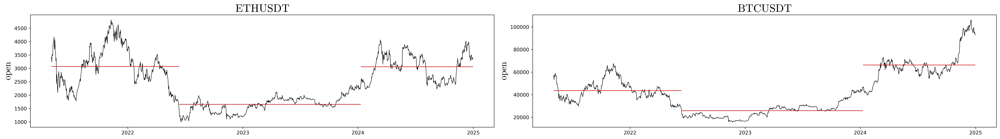

In [4]:
phases = [("2021-05-04", "2022-06-13"), ("2022-06-13", "2024-01-10"), ("2024-01-10", "2024-12-31")]

fig, axes = plt.subplots(1, len(symbols_order), figsize=(14 * len(symbols_order), 4), dpi=600)

for col_idx, symbol in enumerate(symbols_order):
    key = [k for k in dfs if k[0] == symbol][0]
    df = dfs[key].sort_index()
    ax = axes[col_idx]

    ax.plot(df.index, df["open"], linewidth=0.8, color="black")
    ax.set_ylabel(r"$\mathrm{open}$", fontsize=18)
    ax.set_title(rf"$\mathrm{{{symbol}}}$", fontsize=22)

    for start, end in phases:
        start_ts, end_ts = pd.Timestamp(start), pd.Timestamp(end)
        mean_val = df.loc[(df.index >= start_ts) & (df.index < end_ts), "open"].mean()
        ax.hlines(mean_val, xmin=start_ts, xmax=end_ts, color="tab:red", linewidth=1.2, zorder=3)

    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

plt.tight_layout()
plt.show()

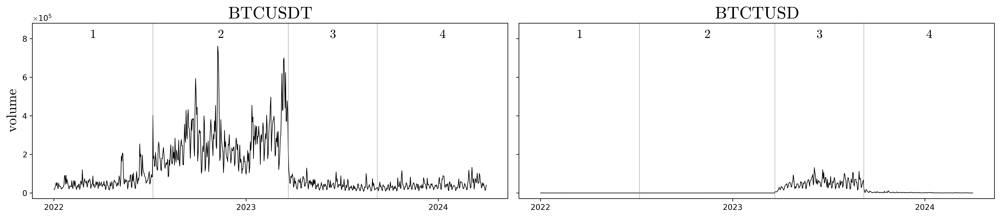

In [5]:
ohlcv_5m_df = con.execute("SELECT * FROM ohlcv_5m WHERE symbol = 'BTCUSDT'").df()
ohlcv_5m_df["datetime"] = pd.to_datetime(ohlcv_5m_df["timestamp"], unit="ms", utc=True)
ohlcv_5m_df["date"] = ohlcv_5m_df["datetime"].dt.floor("D")
binance_df = ohlcv_5m_df.groupby("date").agg(volume=("volume", "sum")).reset_index().set_index("date").sort_index()

btctusdt = pd.read_csv("data/BTCTUSD_1D.csv")
btctusdt["open_time"] = pd.to_datetime(btctusdt["open_time"], unit="ms", utc=True)
btctusdt = btctusdt.set_index("open_time").sort_index()

start, end = "2022-01-01", "2024-04-01"
binance_df = binance_df[(binance_df.index >= start) & (binance_df.index <= end)]
btctusdt_df = btctusdt[(btctusdt.index >= start) & (btctusdt.index <= end)]

event_dates = sorted(pd.Timestamp(d) for d in ["2022-07-08", "2023-03-22", "2023-09-07"])

plt.rcParams["mathtext.fontset"] = "cm"
fig, axes = plt.subplots(1, 2, figsize=(18, 4), dpi=600, sharey=True)

titles = [r"$\mathrm{BTCUSDT}$", r"$\mathrm{BTCTUSD}$"]
data = [binance_df["volume"], btctusdt_df["volume"]]

for ax, series, title in zip(axes, data, titles):
    ax.plot(series.index, series.values, linewidth=0.8, color="black")
    ax.set_title(title, fontsize=22)
    ax.set_ylim(top=ax.get_ylim()[1] * 1.05 if ax.get_ylim()[1] else 1)

    for d in event_dates:
        ax.axvline(d, color="grey", linewidth=0.6, alpha=0.7)

    xmin, xmax = ax.get_xlim()
    bounds = [xmin] + [mdates.date2num(d) for d in event_dates] + [xmax]
    for num, (b_start, b_end) in enumerate(zip(bounds[:-1], bounds[1:]), start=1):
        center = b_start + (b_end - b_start) / 2
        ax.text(center, 0.97, rf"$\mathbf{{{num}}}$", transform=ax.get_xaxis_transform(),
                ha="center", va="top", fontsize=16, color="black")

    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

axes[0].set_ylabel(r"$\mathrm{volume}$", fontsize=18)
axes[0].yaxis.set_major_formatter(mticker.ScalarFormatter(useMathText=True))
axes[0].ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
plt.setp(axes[1].get_yticklabels(), visible=False)

plt.tight_layout()
plt.show()

## **II.3. Cointegration**

We check for cointegration on the overall period as well as for each subperiod. We use Engle-Granger and Johansen tests on price data.

In [6]:
from statsmodels.tsa.stattools import coint
from statsmodels.tsa.vector_ar.vecm import coint_johansen

ohlcv_5m_df = con.execute("SELECT * FROM ohlcv_5m").df()
ohlcv_5m_df["datetime"] = pd.to_datetime(ohlcv_5m_df["timestamp"], unit="ms")
ohlcv_5m_df["date"] = ohlcv_5m_df["datetime"].dt.floor("D")
daily = ohlcv_5m_df.groupby(["symbol", "date"]).agg(open=("open", "first")).reset_index()

eth = daily[daily["symbol"] == "ETHUSDT"].set_index("date")["open"]
btc = daily[daily["symbol"] == "BTCUSDT"].set_index("date")["open"]
eth, btc = eth.align(btc, join="inner")

eg_stat, eg_pvalue, eg_crit = coint(eth, btc)

johansen_result = coint_johansen(pd.concat([eth, btc], axis=1).dropna(), det_order=0, k_ar_diff=1)

corr = eth.corr(btc)

def johansen_sig_level(stat, crit_row):
    levels = [0.10, 0.05, 0.01]
    sig = [lvl for lvl, cv in zip(levels, crit_row) if stat > cv]
    return f"{min(sig)*100:.0f}%" if sig else "not significant"

print("Global")
print(f"Engle-Granger (ETH~BTC): stat={eg_stat:.4f}, significant at: {eg_pvalue*100:.2f}%")
for i, stat in enumerate(johansen_result.lr1):
    print(f"Johansen trace stat (r<={i}): {stat:.4f}, significant at: {johansen_sig_level(stat, johansen_result.cvt[i])}")
print(f"Correlation: {corr:.4f}")

# per phase
phases = [
    (None, "2022-06-13"),
    ("2022-06-13", "2024-01-10"),
    ("2024-01-10", None),
]

for start, end in phases:
    eth_p = eth.loc[start:end]
    btc_p = btc.loc[start:end]

    eg_stat_p, eg_pvalue_p, eg_crit_p = coint(eth_p, btc_p)
    johansen_result_p = coint_johansen(pd.concat([eth_p, btc_p], axis=1).dropna(), det_order=0, k_ar_diff=1)
    corr_p = eth_p.corr(btc_p)

    print(f"\n{start} to {end}")
    print(f"Engle-Granger (ETH~BTC): stat={eg_stat_p:.4f}, significant at: {eg_pvalue_p*100:.2f}%")
    for i, stat in enumerate(johansen_result_p.lr1):
        print(f"Johansen trace stat (r<={i}): {stat:.4f}, significant at: {johansen_sig_level(stat, johansen_result_p.cvt[i])}")
    print(f"Correlation: {corr_p:.4f}")

Global
Engle-Granger (ETH~BTC): stat=-2.2427, significant at: 40.25%
Johansen trace stat (r<=0): 12.9288, significant at: not significant
Johansen trace stat (r<=1): 0.1486, significant at: not significant
Correlation: 0.8126

None to 2022-06-13
Engle-Granger (ETH~BTC): stat=-3.5785, significant at: 2.60%
Johansen trace stat (r<=0): 25.6476, significant at: 1%
Johansen trace stat (r<=1): 4.9835, significant at: 5%
Correlation: 0.9366

2022-06-13 to 2024-01-10
Engle-Granger (ETH~BTC): stat=-3.4004, significant at: 4.23%
Johansen trace stat (r<=0): 14.7005, significant at: 10%
Johansen trace stat (r<=1): 1.9838, significant at: not significant
Correlation: 0.9035

2024-01-10 to None
Engle-Granger (ETH~BTC): stat=-1.8514, significant at: 60.44%
Johansen trace stat (r<=0): 4.9047, significant at: not significant
Johansen trace stat (r<=1): 0.1119, significant at: not significant
Correlation: 0.6172


## **II.4. PoS and PoW market cap evolution**

Extracting then ploting prices and volume.

In [ ]:
# downloading files
#import io
#import zipfile
#from datetime import datetime
#
#import pandas as pd
#import requests
#
#TICKERS = ["BNB", "XRP", "DOGE", "ADA", "MATIC", "DOT", "LTC", "SOL", "SHIB", "TRX", "UNI", "AVAX", "BUSD"] 
#SYMBOL_OVERRIDES = {"MATIC": ["MATIC", "POL"]}
#COLUMNS = ["open_time", "open", "high", "low", "close", "volume", "close_time", "quote_volume", "trades", "taker_buy_base", "taker_buy_quote", "ignore",]
#
#
#def month_range(start, end):
#    months = pd.period_range(start, end, freq="M")
#    return [str(m) for m in months]
#
#
#def download_month(symbol, month):
#    for sym in SYMBOL_OVERRIDES.get(symbol, [symbol]):
#        url = f"https://data.binance.vision/data/spot/monthly/klines/{sym}USDT/1d/{sym}USDT-1d-{month}.zip"
#        r = requests.get(url)
#        if r.status_code == 200:
#            with zipfile.ZipFile(io.BytesIO(r.content)) as z:
#                name = z.namelist()[0]
#                with z.open(name) as f:
#                    df = pd.read_csv(f, header=None, names=COLUMNS)
#            return df
#    return None
#
#
#def process_ticker(ticker):
#    frames = []
#    for month in month_range("2020-06", "2025-12"):
#        df = download_month(ticker, month)
#        if df is not None:
#            frames.append(df)
#        else:
#            print(f"  {ticker} {month}: missing, skip")
#
#    if not frames:
#        print(f"{ticker}: no data, skip")
#        return
#
#    full = pd.concat(frames, ignore_index=True)
#
#    # Handling timestamp change (from 2024 to 2025)
#    full["open_time"] = full["open_time"].apply(lambda x: x / 1000 if x > 1e14 else x)
#    full["open_time"] = pd.to_datetime(full["open_time"], unit="ms")
#
#    full = full[full["open_time"] >= "2020-06-15 00:00:00"]
#    full = full.sort_values("open_time")
#
#    out_path = f"data/{ticker}USDT_1D.csv"
#    full.to_csv(out_path, index=False)
#    print(f"{ticker}: saved: {out_path} ({len(full)} rows)")
#
#
#if __name__ == "__main__":
#    import os
#    os.makedirs("data", exist_ok=True)
#    for ticker in TICKERS:
#        process_ticker(ticker)

In [ ]:
import pandas as pd

# Load all data
TICKERS = ["BNB", "XRP", "DOGE", "ADA", "MATIC", "DOT", "LTC", "SOL", "SHIB", "TRX", "UNI", "AVAX", "BUSD"]
ALL_SYMBOLS = ["BTCUSDT", "ETHUSDT"] + [f"{ticker}USDT" for ticker in TICKERS]

all_dfs = {}

# Add BTC and ETH from existing dfs
for k in dfs:
    symbol = k[0] if isinstance(k, tuple) else k
    if symbol in ["BTCUSDT", "ETHUSDT"]:
        all_dfs[symbol] = dfs[k].copy()

for ticker in TICKERS:
    try:
        df = pd.read_csv(f"data/{ticker}USDT_1D.csv")
        # Check if open_time is numeric (milliseconds) or string
        if pd.api.types.is_numeric_dtype(df["open_time"]):
            df["open_time"] = pd.to_datetime(df["open_time"], unit="ms")
        else:
            df["open_time"] = pd.to_datetime(df["open_time"])
        df = df.set_index("open_time")
        all_dfs[f"{ticker}USDT"] = df
    except FileNotFoundError:
        print(f"Warning: {ticker}_1D.csv not found")
    except Exception as e:
        print(f"Error loading {ticker}: {e}")

# Filter date range
for symbol in list(all_dfs.keys()):
    all_dfs[symbol] = all_dfs[symbol][
        (all_dfs[symbol].index >= "2021-05-01 00:00:00") & 
        (all_dfs[symbol].index <= "2023-12-31 23:59:59")
    ]
    if len(all_dfs[symbol]) == 0:
        print(f"Warning: No data for {symbol} in date range")

# Plot configuration
plt.rcParams["mathtext.fontset"] = "cm"
metrics = ["open", "volume"]

# Filter symbols that actually have data
symbols_order = [s for s in ALL_SYMBOLS if s in all_dfs and len(all_dfs[s]) > 0]

nrows = len(symbols_order) * len(metrics)
fig = plt.figure(figsize=(14, 4 * nrows), dpi=300)
gs = fig.add_gridspec(nrows, 1, hspace=0.15)

ax_idx = 0
for symbol in symbols_order:
    df = all_dfs[symbol].sort_index()
    
    for metric in metrics:
        ax = fig.add_subplot(gs[ax_idx, 0])
        
        ax.plot(df.index, df[metric], linewidth=0.8, color="black")
        ax.set_ylabel(rf"$\mathrm{{{metric}}}$", fontsize=18)
        
        # title
        if metric == "open":
            ax.set_title(rf"$\mathrm{{{symbol}}}$", fontsize=16)
        
        ax.xaxis.set_major_locator(mdates.YearLocator())
        if ax_idx == nrows - 1:  # Last subplot
            ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
        else:
            ax.xaxis.set_major_formatter(mticker.NullFormatter())
        ax_idx += 1

plt.show()

Historical market cap (https://coinmarketcap.com/historical/).

In [18]:
data = {
    "2022-07-03": {
        "BTC": 368272636367.55, "ETH": 130354920626.22, "USDT": 66169266578.19,
        "USDC": 55823349220.82, "BNB": 35754443110.53, "BUSD": 17534713957.66,
        "XRP": 15552125745.52, "ADA": 15377222959.95, "SOL": 11465283748.49,
        "DOGE": 8912747929.92, "DAI": 6900983061.55, "DOT": 6758841572.72,
        "TRX": 6127028339.98, "SHIB": 5512757228.87, "LEO": 5463759130.8,
        "WBTC": 5024037903.24, "AVAX": 4707781238.09, "MATIC": 3688244673.68,
        "UNI": 3607589189.0, "LTC": 3600711101.74,
    },
    "2022-07-10": {
        "BTC": 398237577323.42, "ETH": 141954129136.53, "USDT": 65955599834.55,
        "USDC": 55548556605.24, "BNB": 38313853886.01, "BUSD": 17576677876.55,
        "XRP": 15743541093.95, "ADA": 15718939989.61, "SOL": 12670817158.63,
        "DOGE": 8923774474.6, "DAI": 6887467082.51, "DOT": 6773510351.5,
        "TRX": 6256044022.33, "SHIB": 6159322708.87, "LEO": 5378860779.34,
        "WBTC": 5283323109.02, "AVAX": 5426065716.04, "MATIC": 4574032251.95,
        "UNI": 4597210256.57, "LTC": 3687774051.01,
    },
    "2022-07-17": {
        "BTC": 396808327004.88, "ETH": 162763136859.6, "USDT": 65858779417.22,
        "USDC": 54805466618.9, "BNB": 40467949153.97, "BUSD": 17554013040.77,
        "XRP": 16601593222.52, "ADA": 15093249211.08, "SOL": 13350831260.72,
        "DOGE": 8372496381.54, "DAI": 7173209753.44, "DOT": 6837597553.15,
        "TRX": 6233233495.88, "SHIB": 5896858291.34, "LEO": 5000302858.43,
        "WBTC": 4946266927.59, "AVAX": 5848580199.43, "MATIC": 6029225312.88,
        "UNI": 5107568642.94, "LTC": 3941804801.63,
    },
    "2022-07-24": {
        "BTC": 431890710883.44, "ETH": 194631956742.76, "USDT": 65848592822.54,
        "USDC": 55099785177.26, "BNB": 42248561528.47, "BUSD": 17567977533.57,
        "XRP": 17367749270.93, "ADA": 17342549221.34, "SOL": 14183906920.53,
        "DOGE": 8985046174.94, "DAI": 7377780717.42, "DOT": 7321801591.44,
        "TRX": 6187929126.9, "SHIB": 6373758866.71, "LEO": 4961755249.08,
        "WBTC": 5364577784.99, "AVAX": 6775819683.42, "MATIC": 7056102025.81,
        "UNI": 5304433855.31, "LTC": 4140345126.3,
    },
    "2022-07-31": {
        "BTC": 445941074223.03, "ETH": 204771722888.53, "USDT": 66219690038.41,
        "USDC": 54455842443.43, "BNB": 45751935452.53, "BUSD": 17846505622.18,
        "XRP": 18392533898.45, "ADA": 17544584313.12, "SOL": 14677221207.36,
        "DOGE": 9057728540.12, "DAI": 7432528119.6, "DOT": 8538285441.2,
        "TRX": 6372029570.11, "SHIB": 6430388289.44, "LEO": 4772346139.25,
        "WBTC": 5528772530.06, "AVAX": 6751945512.82, "MATIC": 7458425920.58,
        "UNI": 6235512339.83, "ETC": 4961190229.92,
    },
    "2022-08-07": {
        "BTC": 443014963855.39, "ETH": 207103611495.11, "USDT": 66486127948.63,
        "USDC": 54275863425.54, "BNB": 52099211446.08, "XRP": 18008096794.90,
        "BUSD": 17919074504.39, "ADA": 17796329481.18, "SOL": 14089000374.02,
        "DOT": 9552753760.30, "DOGE": 9146340282.66, "AVAX": 7933884703.30,
        "DAI": 7524168018.41, "MATIC": 7285073636.08, "SHIB": 6607752112.39,
        "UNI": 6551678761.48, "TRX": 6435238348.72, "WBTC": 5482588755.55,
        "ETC": 5138778222.26, "LEO": 4667618100.33,
    },
    "2022-08-14": {
        "BTC": 465024405299.05, "ETH": 236222871624.36, "USDT": 67303183168.52,
        "USDC": 53593155481.32, "BNB": 51303090207.75, "ADA": 19354043699.40,
        "XRP": 18498504133.52, "BUSD": 17721029011.89, "SOL": 15662657782.88,
        "DOGE": 10837495194.11, "DOT": 9918526404.04, "SHIB": 9285829503.26,
        "MATIC": 8042610047.26, "AVAX": 8039834069.16, "DAI": 7264092074.73,
        "UNI": 6621823856.92, "TRX": 6505405779.44, "WBTC": 6013175659.39,
        "ETC": 5668465070.09, "LEO": 4874741042.77,
    },
    "2022-08-21": {
        "BTC": 411906673576.29, "ETH": 197650970990.21, "USDT": 67549185033.31,
        "USDC": 52546676703.59, "BNB": 48732933148.15, "BUSD": 18820506779.31,
        "XRP": 17050167031.87, "ADA": 15730006876.06, "SOL": 12754468528.37,
        "DOGE": 9213780846.68, "DOT": 8253429674.29, "SHIB": 7412142560.03,
        "DAI": 7008387056.86, "MATIC": 6596276264.82, "AVAX": 6548313562.24,
        "TRX": 6096681387.80, "UNI": 5380040357.36, "WBTC": 5335660744.87,
        "LEO": 4875363355.97, "ETC": 4594828506.67,
    },
    "2022-08-28": {
        "BTC": 375367382007.85, "ETH": 174741315285.27, "USDT": 67551567244.39,
        "USDC": 52200895875.09, "BNB": 44569560737.40, "BUSD": 19152402056.18,
        "XRP": 16005208825.41, "ADA": 14515263479.98, "SOL": 10618466610.71,
        "DOGE": 8197164607.49, "DOT": 7606224392.15, "DAI": 6928175802.38,
        "MATIC": 6652117597.23, "SHIB": 6463109789.49, "TRX": 5679257770.69,
        "AVAX": 5253869084.64, "LEO": 4920894179.58, "WBTC": 4847216623.68,
        "UNI": 4285452427.83, "ETC": 4216304807.04,
    },
    "2022-09-04": {
        "BTC": 382576542382.12, "ETH": 192853381586.06, "USDT": 67554552922.52,
        "USDC": 51881772221.08, "BNB": 44987580579.29, "BUSD": 19438038369.83,
        "ADA": 17196438526.17, "XRP": 16472643158.02, "SOL": 11232288701.59,
        "DOGE": 8388285911.62, "DOT": 8207842547.61, "MATIC": 7763819651.46,
        "SHIB": 7043373460.54, "DAI": 6907059654.28, "TRX": 5867913136.97,
        "AVAX": 5596931299.35, "LEO": 5016924079.11, "WBTC": 4951539645.15,
        "UNI": 4825206870.83, "ETC": 4436260430.43,
    },
    "2022-09-11": {
        "BTC": 416840289162.08, "ETH": 215523920726.08, "USDT": 67670904333.26,
        "USDC": 51601695543.86, "BNB": 47620609271.56, "BUSD": 20000545579.16,
        "XRP": 17694152749.41, "ADA": 17424373509.96, "SOL": 12352902118.71,
        "DOT": 8591192714.54, "DOGE": 8452981187.22, "MATIC": 7813837574.46,
        "SHIB": 7139366303.56, "DAI": 6905721201.05, "AVAX": 6108060998.97,
        "TRX": 5920754258.74, "WBTC": 5408505484.18, "ETC": 5266558381.13,
        "UNI": 4843933320.19, "LEO": 4828057845.41,
    },
    "2022-09-18": {
        "BTC": 371970445843.39, "ETH": 163478613611.79, "USDT": 67925116253.37,
        "USDC": 50190456315.35, "BNB": 42966238264.79, "BUSD": 20527981756.14,
        "XRP": 17853819362.85, "ADA": 15285735911.44, "SOL": 10998783712.54,
        "DOGE": 7631164741.49, "DOT": 7206244607.15, "DAI": 6880542889.86,
        "MATIC": 6580625182.11, "SHIB": 5832050551.52, "TRX": 5622583149.21,
        "AVAX": 4948268478.12, "WBTC": 4826847895.18, "LEO": 4440589259.44,
        "ATOM": 4201999328.21, "UNI": 4172427632.91,
    },
    "2022-09-25": {
        "BTC": 360259346858.06, "ETH": 158574740489.22, "USDT": 67958406853.25,
        "USDC": 49589400501.40, "BNB": 44216290548.63, "XRP": 24556855663.57,
        "BUSD": 20530509098.27, "ADA": 15273923717.70, "SOL": 11467768425.61,
        "DOGE": 8113072988.21, "DOT": 6948259923.10, "DAI": 6928906124.27,
        "MATIC": 6465041548.81, "SHIB": 6047944320.56, "TRX": 5516020772.38,
        "AVAX": 5128038285.61, "WBTC": 4599096009.50, "UNI": 4324026545.47,
        "ATOM": 4014201600.39, "LEO": 3892429897.26,
    },
    "2022-10-02": {
        "BTC": 365024821953.69, "ETH": 156481992824.69, "USDT": 67953496945.00,
        "USDC": 47325233841.02, "BNB": 45889655979.06, "XRP": 22397914680.36,
        "BUSD": 21032239187.18, "ADA": 14373740433.11, "SOL": 11393119249.46,
        "DOGE": 7865818784.66, "DOT": 6952768096.08, "DAI": 6830210006.01,
        "MATIC": 6675209425.46, "SHIB": 6009131509.30, "TRX": 5621615915.11,
        "AVAX": 4894804403.14, "UNI": 4766835265.09, "WBTC": 4661339146.37,
        "LEO": 3903706963.56, "LTC": 3701293295.90,
    },
    "2022-10-09": {
        "BTC": 372876821416.38, "ETH": 162317860620.66, "USDT": 68382659680.26,
        "USDC": 46061806382.74, "BNB": 44890165689.89, "XRP": 26627502146.72,
        "BUSD": 21630677038.28, "ADA": 14497057762.59, "SOL": 11755441423.90,
        "DOGE": 8246227943.43, "DOT": 7284545513.46, "MATIC": 7209102274.10,
        "DAI": 6763322037.14, "SHIB": 6060567453.90, "TRX": 5763907265.38,
        "UNI": 5052317445.62, "AVAX": 5005639211.14, "WBTC": 4761346233.92,
        "LEO": 3914942521.01, "LTC": 3846476822.99,
    },
    "2022-10-16": {
        "BTC": 369584293835.81, "ETH": 159856564471.72, "USDT": 68436428830.96,
        "USDC": 45001378931.41, "BNB": 43967624739.43, "XRP": 23833409894.58,
        "BUSD": 21639502431.12, "ADA": 12696667787.84, "SOL": 10800988352.91,
        "DOGE": 7816135871.65, "MATIC": 6983635092.21, "DOT": 6971733578.76,
        "DAI": 6478295358.17, "TRX": 5706781944.50, "SHIB": 5647868033.30,
        "WBTC": 4716347025.22, "AVAX": 4669261774.44, "UNI": 4654101215.56,
        "LEO": 4282311759.22, "LTC": 3675751516.36,
    },
    "2022-10-23": {
        "BTC": 375444263357.01, "ETH": 166850284146.24, "USDT": 68458351755.09,
        "BNB": 44155896392.93, "USDC": 43948066114.08, "XRP": 23398675901.60,
        "BUSD": 21640478801.91, "ADA": 12421822428.42, "SOL": 10489621424.06,
        "DOGE": 8006327876.96, "MATIC": 7859466191.66, "DOT": 6731206661.76,
        "DAI": 6247692839.69, "TRX": 5710865534.10, "SHIB": 5573156882.36,
        "AVAX": 4842167884.58, "WBTC": 4796076868.70, "UNI": 4790499336.15,
        "LEO": 3966833464.64, "LTC": 3854805896.96,
    },
    "2022-10-30": {
        "BTC": 396075135322.21, "ETH": 194670301516.90, "USDT": 69115463004.30,
        "BNB": 50194052761.31, "USDC": 43701223013.97, "XRP": 22961905542.66,
        "BUSD": 21396931013.67, "DOGE": 15628919761.66, "ADA": 13936754372.34,
        "SOL": 11827394126.32, "MATIC": 7938190100.81, "DOT": 7527415814.23,
        "SHIB": 6559431814.73, "DAI": 6236493342.68, "TRX": 5825119411.05,
        "AVAX": 5451183239.07, "UNI": 5263818863.19, "WBTC": 5063733477.03,
        "LEO": 4296660709.35, "ATOM": 3990389175.95,
    },
    "2022-11-06": {
        "BTC": 401792318391.33, "ETH": 192400441552.21, "USDT": 69366918016.01,
        "BNB": 54294354064.46, "USDC": 42187827667.80, "XRP": 23634830440.86,
        "BUSD": 22543376722.70, "DOGE": 15204923054.18, "ADA": 13840734879.51,
        "SOL": 11740670592.50, "MATIC": 9939375600.36, "DOT": 7848721049.44,
        "SHIB": 6496405100.98, "DAI": 6173008697.82, "TRX": 5788111160.87,
        "AVAX": 5469964214.63, "UNI": 5398489366.32, "WBTC": 5133378373.49,
        "LTC": 4871861328.89, "ATOM": 4146727657.12,
    },
    "2022-11-13": {
        "BTC": 314093257178.24, "ETH": 149518741493.03, "USDT": 66350624518.36,
        "BNB": 44245687907.86, "USDC": 44075987661.40, "BUSD": 23371169747.55,
        "XRP": 17088087647.79, "ADA": 11355096055.38, "DOGE": 11262817197.24,
        "MATIC": 7756599334.92, "DOT": 6529528019.22, "DAI": 5928356116.81,
        "SHIB": 4957112107.81, "SOL": 4775608030.77, "TRX": 4692496380.27,
        "UNI": 4428122723.59, "LTC": 4116374478.29, "AVAX": 3944261218.82,
        "WBTC": 3888304437.82, "LEO": 3745202888.70,
    },
    "2022-11-20": {
        "BTC": 313012826679.90, "ETH": 139808065217.86, "USDT": 65817845548.70,
        "USDC": 44459023733.62, "BNB": 42270466525.64, "BUSD": 22900246737.87,
        "XRP": 18205365403.90, "ADA": 10750077836.14, "DOGE": 10238717743.27,
        "MATIC": 7053603934.00, "DOT": 6021362437.69, "DAI": 5881383183.28,
        "SHIB": 4828026653.40, "TRX": 4612003655.87, "LTC": 4442808057.71,
        "SOL": 4443562134.91, "LEO": 4128450129.92, "UNI": 4142128390.81,
        "WBTC": 3817659172.01, "AVAX": 3666368216.30,
    },
    "2022-11-27": {
        "BTC": 316040534591.71, "ETH": 146252301744.43, "USDT": 65336770716.05,
        "BNB": 49179890751.32, "USDC": 44238097613.98, "BUSD": 22408551005.70,
        "XRP": 19959580740.62, "DOGE": 13096141897.47, "ADA": 10759011469.76,
        "MATIC": 7379662277.41, "DOT": 6042343992.91, "DAI": 5686312479.07,
        "LTC": 5381161230.15, "SOL": 5124488709.71, "SHIB": 5091022513.56,
        "TRX": 4905912200.71, "UNI": 4120133329.54, "LEO": 4016731620.28,
        "AVAX": 3872113263.01, "WBTC": 3564597413.77,
    },
}

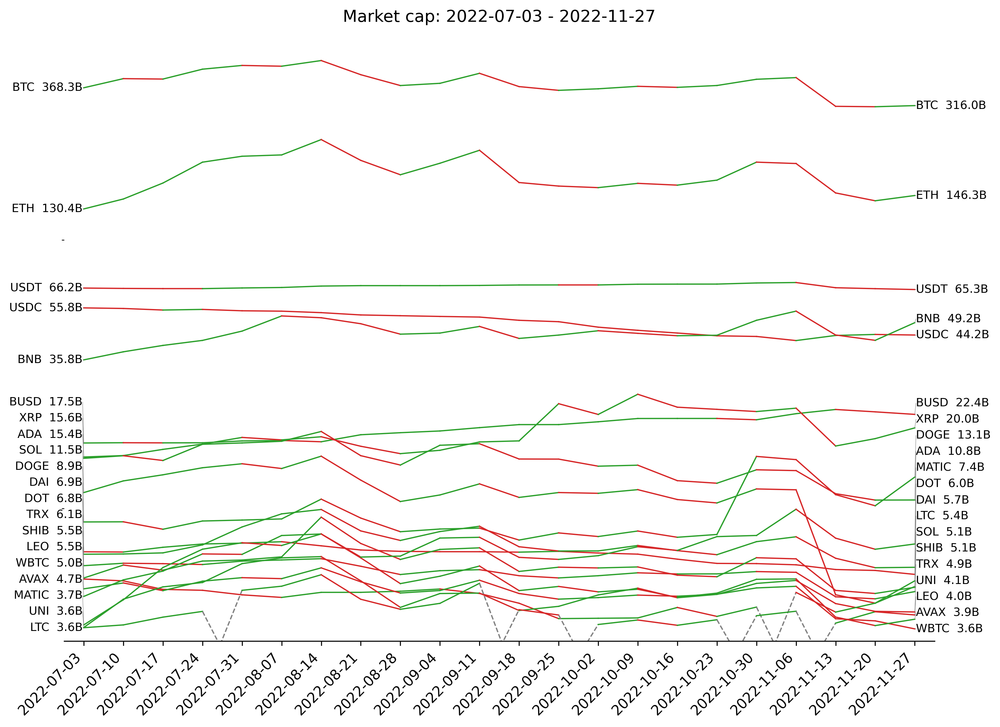

In [29]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

df = pd.DataFrame(data)
dates = list(df.columns)
n = len(dates)

fig, ax = plt.subplots(figsize=(0.5 * n, 8), dpi=300)

def declutter(items, min_gap=0.06):
    items = sorted(items, key=lambda x: x[0])
    positions = [v for v, _ in items]
    for i in range(1, len(positions)):
        if positions[i] - positions[i - 1] < min_gap:
            positions[i] = positions[i - 1] + min_gap
    return positions

# per-date label positions (decluttered in log space)
labels = []
for date in dates:
    col = df[date].dropna()
    log_vals = [(np.log10(v), c) for c, v in col.items()]
    pos = declutter(log_vals)
    labels.append({c: 10 ** p for p, (_, c) in zip(pos, sorted(log_vals))})

ymin = df.min().min()
offchart = ymin * 0.6

for c in df.index:
    values = [df.at[c, date] if not pd.isna(df.at[c, date]) else None for date in dates]

    for i in range(n - 1):
        y1, y2 = values[i], values[i + 1]
        if y1 is not None and y2 is not None:
            color = "tab:green" if y2 > y1 else "tab:red"
            ax.plot([i, i + 1], [y1, y2], marker=",", color=color, linewidth=1)
        elif y1 is not None and y2 is None:
            ax.plot([i, i + 1], [y1, offchart], marker=",", color="grey", linewidth=1, linestyle="--")
        elif y2 is not None and y1 is None:
            ax.plot([i, i + 1], [offchart, y2], marker=",", color="grey", linewidth=1, linestyle="--")

    # left label at first date
    if values[0] is not None:
        ax.plot([-0.03, 0], [labels[0][c], values[0]], color="grey", linewidth=0.3)
        ax.text(-0.03, labels[0][c], f"{c}  {values[0]/1e9:.1f}B", ha="right", va="center", fontsize=9)
    # right label at last date
    if values[-1] is not None:
        ax.plot([n - 1, n - 1 + 0.03], [values[-1], labels[-1][c]], color="grey", linewidth=0.3)
        ax.text(n - 1 + 0.03, labels[-1][c], f"{c}  {values[-1]/1e9:.1f}B", ha="left", va="center", fontsize=9)

ax.set_yscale("symlog", linthresh=1e3)
ax.set_xlim(-0.5, n - 0.5)
ax.set_xticks(range(n))
ax.set_xticklabels(dates, fontsize=11, rotation=45, ha="right")
ax.set_yticks([])
for spine in ["top", "right", "left"]:
    ax.spines[spine].set_visible(False)
ax.set_title(f"Market cap: {dates[0]} - {dates[-1]}", fontsize=13)

ax.set_ylim(bottom=ymin * 0.9)
plt.tight_layout()
plt.show()